## Finiding quasi-adaptive CRN with gradient-guided evolution

---

### Problem's setup

In [472]:
eval(Meta.parse("@variables " * join([ifelse(i==3 && j==80, "", "ks_" * string(i) * "_" * string(j) *"(t), ") for i in 1:3 for j in 1:80]) * "ks_" * string(3) * "_" * string(80) * "(t)"))

240-element Vector{Num}:
  ks_1_1(t)
  ks_1_2(t)
  ks_1_3(t)
  ks_1_4(t)
  ks_1_5(t)
  ks_1_6(t)
  ks_1_7(t)
  ks_1_8(t)
  ks_1_9(t)
 ks_1_10(t)
          ⋮
 ks_3_72(t)
 ks_3_73(t)
 ks_3_74(t)
 ks_3_75(t)
 ks_3_76(t)
 ks_3_77(t)
 ks_3_78(t)
 ks_3_79(t)
 ks_3_80(t)

In [473]:
# Load libraries
include("CRNExplore.jl")
include("SymbolicOps.jl")

# fixed, basic steps

target = N
crn = create_reactions(N)
ode_crn = convert(ODESystem, crn)
np = count_parameters(N)

# set up hyperparameters

t0 = 10.
t1 = 30.
input = 1.
perturbation = 1.

# generate p0
pars_v = [rand() for i in 1:np]
pars_l = assemble_opt_parameters_and_varables(pars_v, N)

# set up the loss function
weights = [1., 10., 1.0/100, 1.] #[1.0/50, 1.0, 1.0/80, 1.0] #[1., 0.01, 0.01, 1.] # this descends smoothly
p=0.5
d=1.0
f_ss=0.3

# finalize initialization

ext_ode = make_sensitivity_ode(ode_crn, pars_l.p)

norm_for_sensitivity_loss = 1
norm_for_ss_loss = 1
norm_for_adaptation_loss = 1
loss_args = prepare_args(nothing, target, t0, t1, pars_l, weights, p, d, f_ss, norm_for_sensitivity_loss, norm_for_ss_loss, norm_for_adaptation_loss)
s_loss = total_loss_symbolic(loss_args)
loss_derivatives = compute_symbolic_derivatives_of_loss(s_loss)

# set up optimization parameters

alpha = 0.05     # learning rate
N_iter = 1000      # number of iterations

K = 5               # perturbation samples per iteration
perturbation_list = [0.25, 0.5, 0.75, 1.25, 1.5, 1.75] .- 1 #, 2., 3., 4., 5., 6., 7., 8., 9., 10.]

# output data structures
loss_tape = []
loss_tape_array = []
parameter_tape = []
gradient_tape = []
optimizer_tape = []

grad_history_ada = vec(zeros(length(pars_v)))
momentum_adam = vec(zeros(length(pars_v)))
velocity_adam = vec(zeros(length(pars_v)))
non_pruned_parameters = vec(ones(length(pars_v))) # implement heuristic to prune parameters

#push!(loss_tape, total_loss_eval(loss_args))
push!(parameter_tape, pars_v)
push!(gradient_tape, zeros(np))
push!(optimizer_tape, zeros(np))

# additional options
use_pruning_heuristic = true
clip_value = nothing
use_gradient_normalization = false
use_adagrad = true # overrides use_adam!
use_adam = false
use_random_perturbation = false

false

In [474]:
s_loss

(k_1 + k_10 + k_11 + k_12 + k_13 + k_14 + k_15 + k_16 + k_17 + k_18 + k_19 + k_2 + k_20 + k_21 + k_22 + k_23 + k_24 + k_25 + k_26 + k_27 + k_28 + k_29 + k_3 + k_30 + k_31 + k_32 + k_33 + k_34 + k_35 + k_36 + k_37 + k_38 + k_39 + k_4 + k_40 + k_41 + k_42 + k_43 + k_44 + k_45 + k_46 + k_47 + k_48 + k_49 + k_5 + k_50 + k_51 + k_52 + k_53 + k_54 + k_55 + k_56 + k_57 + k_58 + k_59 + k_6 + k_60 + k_61 + k_62 + k_63 + k_64 + k_65 + k_66 + k_67 + k_68 + k_69 + k_7 + k_70 + k_71 + k_72 + k_73 + k_74 + k_75 + k_76 + k_77 + k_78 + k_79 + k_8 + k_80 + k_9)*w₃ + w₁*ifelse(dU >= 0.0, (-0.75 + at_t1₃)^2, 0.0) + w₄*ifelse(dU < 0.0, (-0.25 + at_t1₃)^2, 0.0) + ((-at_t0_d₁ + at_t0₁)^2 + (-at_t0_d₂ + at_t0₂)^2 + (-at_t0_d₃ + at_t0₃)^2 + (-at_t1_d₁ + at_t1₁)^2 + (-at_t1_d₂ + at_t1₂)^2 + (-at_t1_d₃ + at_t1₃)^2)*w₂

In [475]:
Symbolics.derivative(s_loss, at_t0[3])

2(-at_t0_d₃ + at_t0₃)*w₂

In [476]:
Symbolics.derivative(s_loss, o_t0pdt)

0

In [477]:
Symbolics.derivative(s_loss, at_t1[3])

2(-at_t1_d₃ + at_t1₃)*w₂ + w₁*ifelse(dU >= 0.0, 2(-0.75 + at_t1₃), 0) + w₄*ifelse(dU < 0.0, 2(-0.25 + at_t1₃), 0)

#### Training

In [478]:
# profiling @(100, 5) ~ 18s 
for i in 1:N_iter
    gradient = zeros(np) # zero the gradient
    loss_tape = push!(loss_tape, 0.)
    loss_tape_array = push!(loss_tape_array, zeros(n_losses))
    if use_random_perturbation
        for _ in 1:K
            # profiling @(100, 5) ~ 13.5s 
            sol = run_extended(ext_ode, pars_v, pars_l, input, perturbation, t0, t1)      # change to be more flexible in the perturbation events
            # profiling @(100, 5) ~ 0s 
            loss_args = update_args(sol, target, t0, t1, pars_l, loss_args, p, d, f_ss)   # prepare the input for the next step
            # profiling @(100, 5) ~ 3s
            # loss = total_loss_eval(loss_args)
            # loss_tape[end] += loss.total.val                        # record the loss
            # loss_tape_array[end] += loss.array
            # symbolically "backpropagate"
            # profiling @(100, 5) ~ 3s
            jacobian = jacobian_pars(ext_ode, loss_args, loss_derivatives, sol, N, t0, t1, pars_v, pars_l, f_ss, d, [[Symbol("x_$(i)") for i in 1:N]..., Symbol("U")])
            # profiling @(100, 5) ~ 1s
            gradient += vec([v.val for v in jacobian.sensitivity])  # check efficiency with symbolic operations (maybe we have to use "real" types directly)
            loss_tape[end] += jacobian.loss                         # record the loss
            loss_tape_array[end] = loss_tape_array[end] + jacobian.loss_array
        end
    else
        solutions = run_extended_with_fixed_perturbations(ext_ode, pars_l, input, perturbation_list, t0, t1)
        for sol in solutions
            loss_args = update_args(sol, target, t0, t1, pars_l, loss_args, p, d, f_ss)   # prepare the input for the next step
            # loss = total_loss_eval(loss_args)
            # loss_tape[end] = loss_tape[end] + loss.total.val              # record the loss
            # loss_tape_array[end] = loss_tape_array[end] + loss.array
            # symbolically "backpropagate"
            jacobian = jacobian_pars(ext_ode, loss_args, loss_derivatives, sol, N, t0, t1, pars_v, pars_l, f_ss, d, [[Symbol("x_$(i)") for i in 1:N]..., Symbol("U")])
            gradient += vec([v.val for v in jacobian.sensitivity])  # check efficiency with symbolic operations (maybe we have to use "real" types directly)
            loss_tape[end] += jacobian.loss                         # record the loss
            loss_tape_array[end] = loss_tape_array[end] + jacobian.loss_array
        end
    end
    if use_random_perturbation
        loss_tape[end] /= K # average the recorded loss
        loss_tape_array[end] ./= K
        gradient /= K       # average the gradient
    else
        loss_tape[end] /= length(perturbation_list) # average the recorded loss
        loss_tape_array[end] ./= length(perturbation_list)
        gradient /= length(perturbation_list)       # average the gradient
    end

    if use_pruning_heuristic 
        gradient = gradient .* non_pruned_parameters
    end


    if clip_value != nothing
        gradient = max.(min.(gradient, clip_value), -clip_value)
    end
    if use_gradient_normalization
        m = maximum(abs.(gradient))
        if m > 1.
            gradient /= m
        end
    end

    max_gradient = maximum(abs.(gradient))
    gradient = gradient + max_gradient/100.0.*randn(length(gradient)) .- max_gradient/200 # add some noise to the gradient

    if use_adagrad
        lr = adagrad_update_get_coefficient(pars_v, gradient, grad_history_ada, alpha)
        push!(optimizer_tape, lr)
    elseif use_adam
        lr = ADAM_update_get_coefficient(pars_v, gradient, momentum_adam, velocity_adam, alpha, i, 0.9, 0.9, 1e-8)
        push!(optimizer_tape, lr)
    else
        lr = alpha
    end
    
    # update the parameters (avoid negative values) 
    
    if use_pruning_heuristic
        pars_v = max.(0., pars_v - (lr .* gradient)).*non_pruned_parameters
        non_pruned_parameters = (pars_v .> 0.0001)
    else
        pars_v = max.(0., pars_v - (lr .* gradient))
    end
    # update dictionary like parameters
    pars_l = assemble_opt_parameters_and_varables(pars_v, N) 
    
    push!(parameter_tape, pars_v)
    push!(gradient_tape, gradient)
end

### Plotting

---

##### Loss

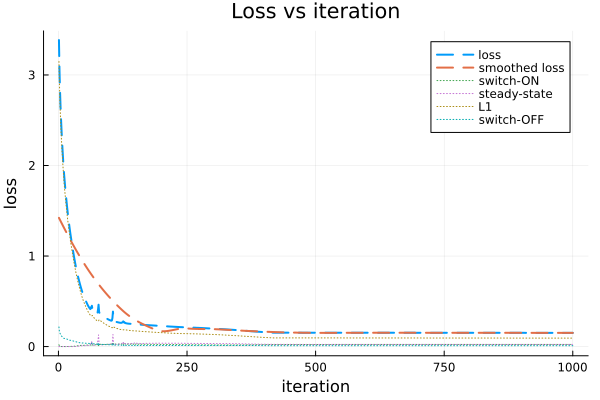

In [479]:
using Loess
loss_names = ["switch-ON", "steady-state", "L1", "switch-OFF"]
plot(1:length(loss_tape), loss_tape, label="loss", xlabel="iteration", ylabel="loss", title="Loss vs iteration", lw=2, legend=:topright, linestyle=:dash)
# smooth interpolation of the loss
model = loess(1:length(loss_tape), convert(Vector{Float64}, loss_tape), span=0.5)
predictions = predict(model, 1:length(loss_tape))
plot!(1:length(loss_tape), predictions, label="smoothed loss", lw=2, line=:dash)
for i in 1:n_losses
    #if sum([x[i].val for x in loss_tape_array]) > 0.
    plot!(1:length(loss_tape), [x[i] for x in loss_tape_array], lw=1, line=:dot, label=loss_names[i])
    #end
end
plot!()

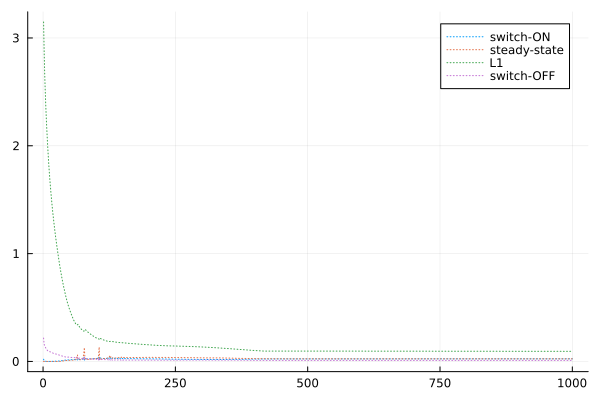

In [480]:
for i in 1:n_losses
    if i == 1
        plot(1:length(loss_tape), [x[i] for x in loss_tape_array], lw=1, line=:dot, label=loss_names[i])
    else
        plot!(1:length(loss_tape), [x[i] for x in loss_tape_array], lw=1, line=:dot, label=loss_names[i])
    end
end
plot!()

In [482]:
#sensitivity_from_ode(ext_ode, sol, 10.) 

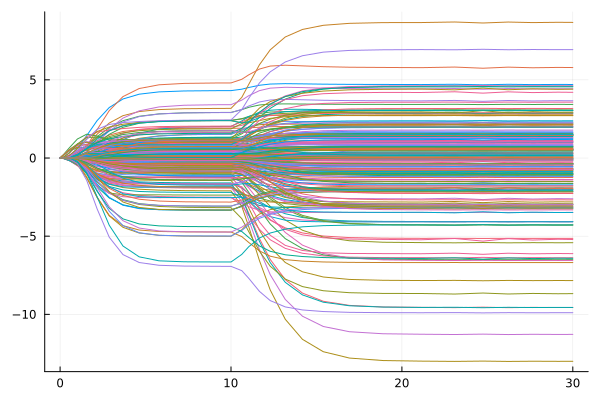

In [483]:
function test(ext_ode, pars_l, input, perturbation_list, t0, t1)

    condition = [t0]
    named_u_p = extend_u0(ext_ode, pars_l.u0, pars_l.p, N)
    prob = ODEProblem(ext_ode, named_u_p.u0, (0., t1), named_u_p.p)

    solutions = Array{Any}(undef, length(perturbation_list))

    Threads.@threads for i in 1:length(perturbation_list)
        perturbation = perturbation_list[i]
        function affect!(integrator)
            integrator[:U] = max(0., input + perturbation )
        end
        ps_cb = PresetTimeCallback(condition, affect!)
        sol = solve(prob, Tsit5(), reltol=1e-2, abstol=1e-2, callback=ps_cb)
        solutions[i] = sol
    end
    return solutions
end

sol = test(ext_ode, opt_pars_l, input, [ 2 ], t0, t1)[1]

solmat =  vec2mat(sol.u)[:,5:end]

#total_sensitivity = [[solmat[j, i] + solmat[j, i+80] + solmat[j, i+160] for i in 1:80] for j in 1:size(solmat,1)]
#println(size(solmat))

#plot(sol.t, vec2mat(total_sensitivity), legend=false)
plot(sol.t, solmat, legend=false)

##### Response on best

Optimal index: 1000


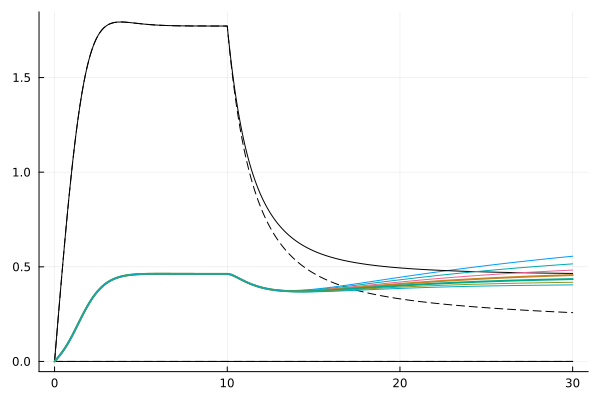

In [484]:
perturbs = [-0.99, -0.98, -0.97, -0.96, -0.95, -0.94, -0.93] #[0, 0.5, 0.7, 0.9, 1.1, 1.3, 1.5] .- 1
opt_index = argmin(loss_tape)
#opt_index = argmin(predictions)
#opt_index = 75#length(loss_tape) 

opt_pars_v = parameter_tape[opt_index]
opt_pars_l = assemble_opt_parameters_and_varables(opt_pars_v, N)

sols = [ run_extended_with_fixed_perturbations(ext_ode, opt_pars_l, input, [ perturb ], t0, t1)[1] for perturb in perturbs ]
println("Optimal index: ", opt_index)
#println("Adaptation error: ", abs(sol(t0)[3] - sol(t1)[3]))
#println("sensitivity: ", abs(sol(t0)[3] - sol(t0+d)[3]), " and  loss : ", abs(abs(sol(t0)[3] - sol(t0+d)[3]) - p))
plot(sols[1].t, vec2mat(sols[1].u)[:,3], label="perturb = $(perturbs[1])", legend=false)
plot!(sols[7].t, vec2mat(sols[7].u)[:,[1,2]], label="perturb = $(perturbs[1])", color=:black, legend=false)
plot!(sols[1].t, vec2mat(sols[1].u)[:,[1,2]], label="perturb = $(perturbs[1])", color=:black, linestyle=:dash, legend=false)
for i in 2:length(perturbs)
    if perturbs[i] == perturbs[4] || perturbs[i] == perturbs[5]
        plot!(sols[i].t, vec2mat(sols[i].u)[:,[3]], label="perturb = $(perturbs[2])", lw=2, legend=false)
    else
        plot!(sols[i].t, vec2mat(sols[i].u)[:,[3]], label="perturb = $(perturbs[2])", legend=false)
    end
end
plot!()

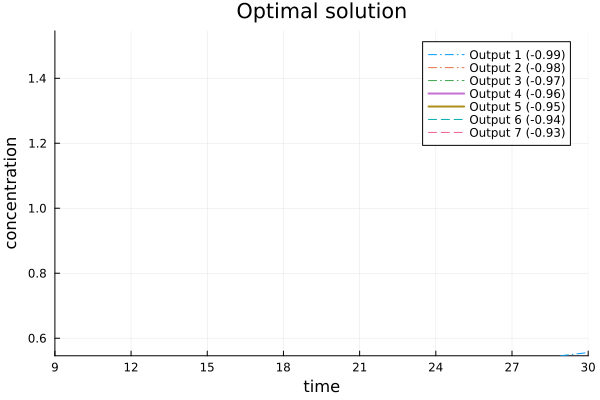

In [485]:
# zoom on reaction 3
plot(sols[1].t, vec2mat(sols[1].u)[:,3], label="Output 1 ($(perturbs[1]))", xlabel="time", ylabel="concentration", title="Optimal solution", lw=1, line=:dashdot)
for i in 2:length(perturbs)
    if perturbs[i] == perturbs[4] || perturbs[i] == perturbs[5]
        plot!(sols[i].t, vec2mat(sols[i].u)[:,3], label="Output $i ($(perturbs[i]))", lw=2)
    else
        plot!(sols[i].t, vec2mat(sols[i].u)[:,3], label="Output $i ($(perturbs[i]))", lw=1, line=ifelse(i<=4, :dashdot, :dash))
    end
end
xlims!(t0-1., t1)
ylims!(sols[1](t1)[3]-0.01, sols[end](t1)[3]+0.01)

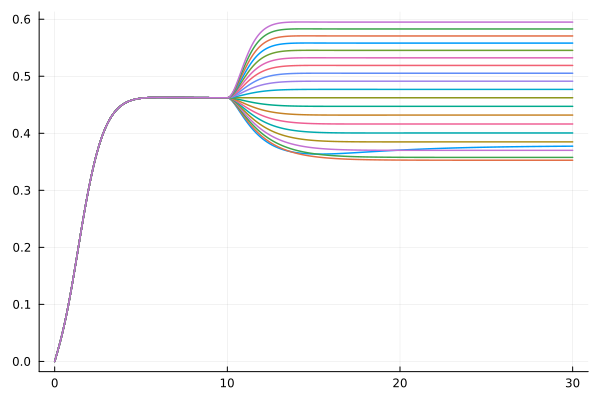

In [486]:
inputs = [i*0.1 for i in 1:20].-1

solutions = run_with_fixed_perturbations(crn, opt_pars_v, opt_pars_l, 1., inputs, t0, t1)
plot()
sss = [] 
for sol in solutions
    plot!(sol.t, vec2mat(sol.u)[:,3], lw=1.5, label="U perturbed", legend=false)
    push!(sss, sol(t1)[3])
end
plot!()

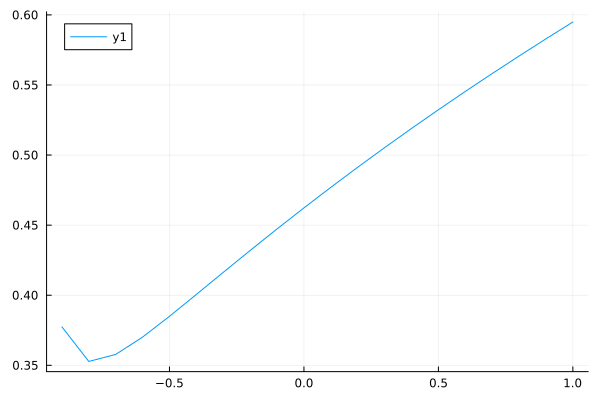

In [487]:
plot(inputs, sss)

compare the response on the 3rd species for the three options

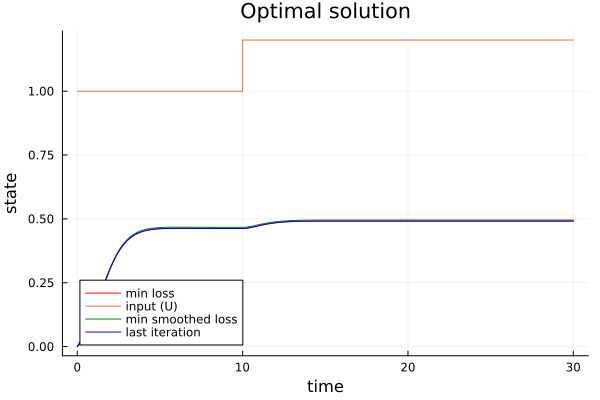

In [488]:
opt_index_options = [argmin(loss_tape), argmin(predictions), length(loss_tape)]
opt_index_options_labels = ["min loss", "min smoothed loss", "last iteration"]
opt_index_options_colors = [:red, :green, :blue]
perturb = 0.2
for i in 1:length(opt_index_options)
    opt_index = opt_index_options[i]
    opt_pars_v = parameter_tape[opt_index]
    opt_pars_l = assemble_opt_parameters_and_varables(opt_pars_v, N)
    sol = run_extended_with_fixed_perturbations(ext_ode, opt_pars_l, input, [ perturb ], t0, t1)[1]
    if i == 1
        plot(sol.t, vec2mat(sol.u)[:,3], label=opt_index_options_labels[i], xlabel="time", ylabel="state", title="Optimal solution", lw=1, legend=:bottomleft, color=opt_index_options_colors[i])
        plot!(sol.t, vec2mat(sol.u)[:,4], label="input (U)", lw=1, legend=:bottomleft)
    else
        plot!(sol.t, vec2mat(sol.u)[:,3], label=opt_index_options_labels[i], lw=1, legend=:bottomleft, color=opt_index_options_colors[i])
    end
end
plot!()

##### gradients

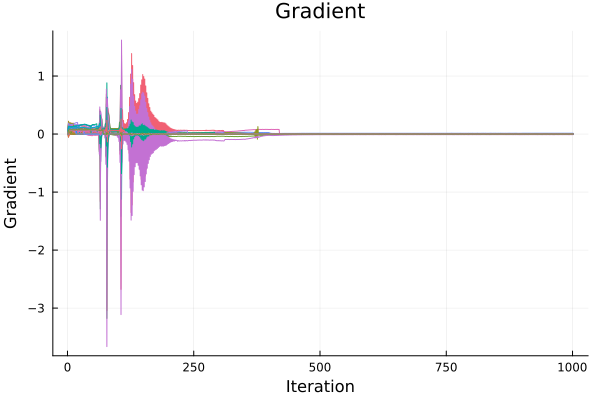

In [489]:
plot(1:length(gradient_tape), vec2mat(gradient_tape), legend=false, title="Gradient", xlabel="Iteration", ylabel="Gradient")

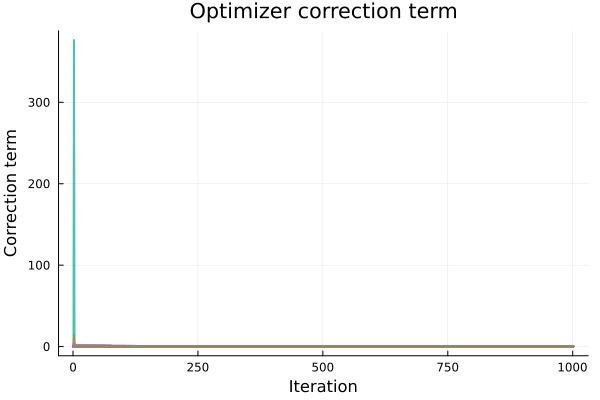

In [490]:
plot(1:length(optimizer_tape), vec2mat(optimizer_tape), label="Optimizer correction term", xlabel="Iteration", ylabel="Correction term", title="Optimizer correction term", lw=2, legend=false, alpha=0.7)

In [491]:
vec2mat(gradient_tape)[end,gradient_tape[end].>0]

23-element Vector{Float64}:
 3.1939922099698254e-5
 8.936831788039062e-5
 0.01400661143005387
 6.166811164587703e-5
 6.1008830649467106e-5
 7.093696307562228e-5
 0.00012100458737240085
 0.0016636727426337784
 3.6156803488401705e-6
 1.5573934725253167e-5
 ⋮
 0.00010274819868963218
 5.6319991699820015e-5
 7.841653292401806e-5
 4.3493301139802587e-5
 0.0001090611148734735
 0.0001526990244691264
 0.00011282268871331001
 5.669014466247368e-5
 0.00036438531048891187

##### parameters

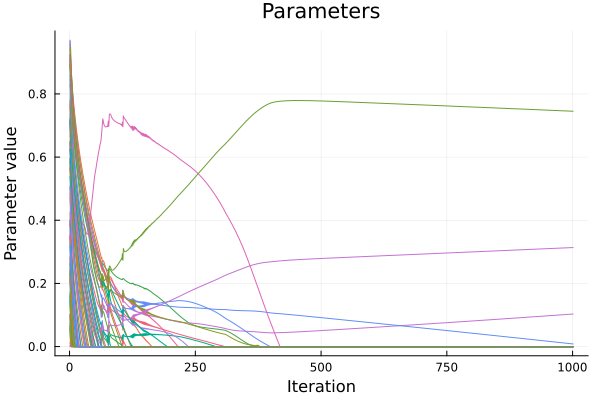

In [492]:
plot(1:length(parameter_tape), vec2mat(parameter_tape), legend=false, title="Parameters", xlabel="Iteration", ylabel="Parameter value")

prameter histogram

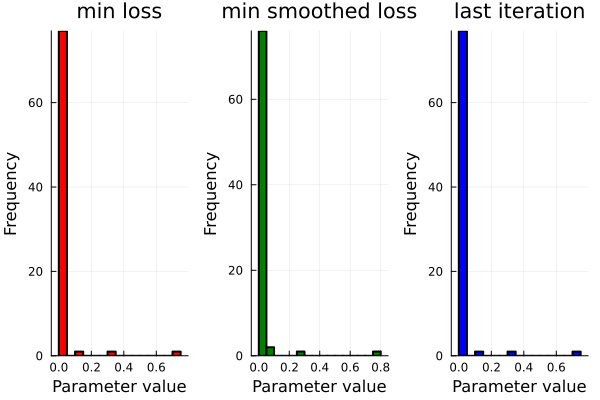

In [493]:
opt_index_options = [argmin(loss_tape), argmin(predictions), length(loss_tape)]
opt_index_options_labels = ["min loss", "min smoothed loss", "last iteration"]
opt_index_options_colors = [:red, :green, :blue]

hists = []
for i in 1:length(opt_index_options)
    opt_index = opt_index_options[i]
    opt_pars_v = parameter_tape[opt_index]
    opt_pars_l = assemble_opt_parameters_and_varables(opt_pars_v, N)
    h = histogram(opt_pars_v, label=opt_index_options_labels[i], xlabel="Parameter value", ylabel="Frequency", title=opt_index_options_labels[i], lw=2, legend=false, color=opt_index_options_colors[i], bins=20)
    push!(hists, h)
end
plot(hists..., layout=(1,3))

In [494]:
vec2mat(gradient_tape)[2,gradient_tape[2].<0]

7-element Vector{Float64}:
 -0.04627756190394189
 -0.048258922344143265
 -0.05653219358135429
 -0.000132801706246624
 -0.0035028688653019717
 -0.006854465188135449
 -0.007574344922905061

In [495]:
gradient_tape[2].>0

80-element BitVector:
 1
 1
 1
 1
 1
 1
 1
 1
 1
 1
 ⋮
 1
 1
 1
 1
 1
 1
 1
 1
 1

##### Evaluate adaptation type

In [496]:
using Symbolics
using LinearAlgebra
function joint_jacobian(i, j, jac, initial_conditions)
    A_ij = substitute(jac[i, j], unsym_dict(initial_conditions))
    return A_ij
end

opt_index = argmin(loss_tape)
# opt_index = argmin(predictions)
# opt_index = length(loss_tape)

opt_pars_v = parameter_tape[opt_index]
opt_pars_l = assemble_opt_parameters_and_varables(opt_pars_v, N)

jac = Symbolics.substitute(calculate_jacobian(ode_crn), unsym_dict(opt_pars_l.p))

perturb = 1.
steady_state_after_perturbation = run_extended_with_fixed_perturbations(ext_ode, opt_pars_l, input, [ perturb ], t0, t1)[1](t1)[1:3]
steady_state_after_perturbation = [
    :x_1 => steady_state_after_perturbation[1],
    :x_2 => steady_state_after_perturbation[2],
    :x_3 => steady_state_after_perturbation[3]
]

A_21 = joint_jacobian(2, 1, jac, steady_state_after_perturbation)
A_32 = joint_jacobian(3, 2, jac, steady_state_after_perturbation)
A_22 = joint_jacobian(2, 2, jac, steady_state_after_perturbation)
A_31 = joint_jacobian(3, 1, jac, steady_state_after_perturbation)

println("A_21 = ", A_21)
println("A_32 = ", A_32)
println("A_22 = ", A_22)
println("A_31 = ", A_31)
println("A_22*A_31 = ", A_22*A_31)
println("A_21*A_32 = ", A_21*A_32)
println("A_22*A_31 - A_21*A_32 = ", A_22*A_31 - A_21*A_32)

A_21 = 0.0
A_32 = 0.0
A_22 = 0.0
A_31 = 0.3527970234978284
A_22*A_31 = 0.0
A_21*A_32 = 0.0
A_22*A_31 - A_21*A_32 = 0.0


In [497]:
Symbolics.substitute(jac, unsym_dict(steady_state_after_perturbation))

3×4 Matrix{Num}:
 -1.23102   0.0  -1.87203  1
  0.0       0.0   0.0      0
  0.352797  0.0  -1.87203  0

In [498]:
steady_state_after_perturbation = run_extended_with_fixed_perturbations(ext_ode, opt_pars_l, input, [ perturb ], t0, t1)[1](t1)[1:3]

3-element Vector{Float64}:
 2.5120439022901646
 0.0
 0.5949473205375119

In [499]:
# TODO to be fixed
compute_homeostatic_coefficient(crn, calculate_jacobian(ode_crn), [1 for i in 1:np])

(coefficient = -419.54327612949135, A_21 = 10.244398556978787, A_32 = 10.244398556975291, A_22 = -30.709033096051662, A_31 = 10.244398556975291, A_22_A_31 = -314.5955743352981, A_21_A_32 = 104.94770179419324)

### check surviving reactions 

In [500]:
opt_index = length(loss_tape)
ranks = reverse(sortperm(abs.(parameter_tape[opt_index])))

for i in ranks
    if i != 1
        println(parameter_tape[opt_index][i], " : ", reactions(crn)[2:end][i])
    end
end

0.7452212835650075 : k_32, x_1 + x_3 --> ∅
0.3135524157869647 : k_52, 2*x_1 --> x_1 + x_3
0.10307341562103693 : k_4, ∅ --> x_1 + x_3
0.008506995236359921 : k_13, x_1 --> x_1 + x_3
0.0 : k_80, 2*x_3 --> x_2 + x_3
0.0 : k_79, 2*x_3 --> 2*x_2
0.0 : k_78, 2*x_3 --> x_1 + x_3
0.0 : k_77, 2*x_3 --> x_1 + x_2
0.0 : k_76, 2*x_3 --> 2*x_1
0.0 : k_75, x_2 + x_3 --> 2*x_3
0.0 : k_74, x_2 + x_3 --> 2*x_2
0.0 : k_73, x_2 + x_3 --> x_1 + x_3
0.0 : k_72, x_2 + x_3 --> x_1 + x_2
0.0 : k_71, x_2 + x_3 --> 2*x_1
0.0 : k_70, 2*x_2 --> 2*x_3
0.0 : k_69, 2*x_2 --> x_2 + x_3
0.0 : k_68, 2*x_2 --> x_1 + x_3
0.0 : k_67, 2*x_2 --> x_1 + x_2
0.0 : k_66, 2*x_2 --> 2*x_1
0.0 : k_65, x_1 + x_3 --> 2*x_3
0.0 : k_64, x_1 + x_3 --> x_2 + x_3
0.0 : k_63, x_1 + x_3 --> 2*x_2
0.0 : k_62, x_1 + x_3 --> x_1 + x_2
0.0 : k_61, x_1 + x_3 --> 2*x_1
0.0 : k_60, x_1 + x_2 --> 2*x_3
0.0 : k_59, x_1 + x_2 --> x_2 + x_3
0.0 : k_58, x_1 + x_2 --> 2*x_2
0.0 : k_57, 

x_1 + x_2 --> x_1 + x_3
0.0 : k_56, x_1 + x_2 --> 2*x_1
0.0 : k_55, 2*x_1 --> 2*x_3
0.0 : k_54, 2*x_1 --> x_2 + x_3
0.0 : k_53, 2*x_1 --> 2*x_2
0.0 : k_51, 2*x_1 --> x_1 + x_2
0.0 : k_50, 2*x_3 --> x_2
0.0 : k_49, 2*x_3 --> x_1
0.0 : k_48, x_2 + x_3 --> x_3
0.0 : k_47, x_2 + x_3 --> x_2
0.0 : k_46, x_2 + x_3 --> x_1
0.0 : k_45, 2*x_2 --> x_3
0.0 : k_44, 2*x_2 --> x_1
0.0 : k_43, x_1 + x_3 --> x_3
0.0 : k_42, x_1 + x_3 --> x_2
0.0 : k_41, x_1 + x_3 --> x_1
0.0 : k_40, x_1 + x_2 --> x_3
0.0 : k_39, x_1 + x_2 --> x_2
0.0 : k_38, x_1 + x_2 --> x_1
0.0 : k_37, 2*x_1 --> x_3
0.0 : k_36, 2*x_1 --> x_2
0.0 : k_35, 2*x_3 --> ∅
0.0 : k_34, x_2 + x_3 --> ∅
0.0 : k_33, 2*x_2 --> ∅
0.0 : k_31, x_1 + x_2 --> ∅
0.0 : k_30, 2*x_1 --> ∅
0.0 : k_29, x_3 --> ∅
0.0 : k_28, x_2 --> ∅
0.0 : k_27, x_1 --> ∅
0.0 : k_26, x_3 --> x_2 + x_3
0.0 : k_25, x_3 --> 2*x_2
0.0 : k_24, x_3 --> x_1 + x_3
0.0 : k_23, x_3 --> x_1 + x_2
0.0 : k_22, x_3 --> 2*x_1
0.0 : k_21, x_2 --> 2*x_3
0.0 : k_20, x_2 --> x_2 + x_3
0.0 : 

In [501]:
pars_v = [0. for i in 1:np]
pars_l = assemble_opt_parameters_and_varables(pars_v, N)
sol = run_extended(ext_ode, pars_v, pars_l, input, perturbation, t0, t1)
sm = sensitivity_from_ode(ode_crn, sol, t0)

3×80 Matrix{Float64}:
  0.0   0.0  10.0  10.0   0.0  -50.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 10.0   0.0  10.0   0.0  10.0   50.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
  0.0  10.0   0.0  10.0  10.0    0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0

In [502]:
sm[1, 19]

0.0

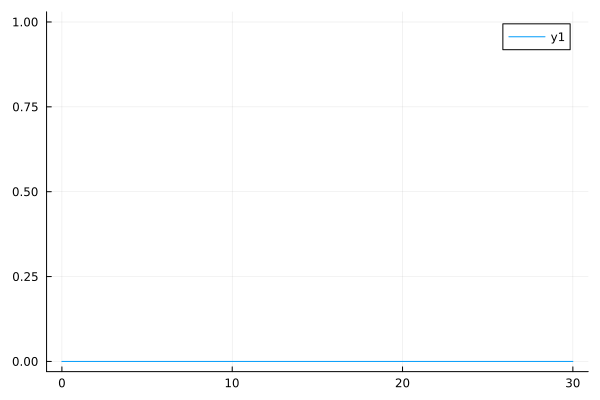

In [503]:
plot(sol.t, vec2mat(sol.u)[:,3])

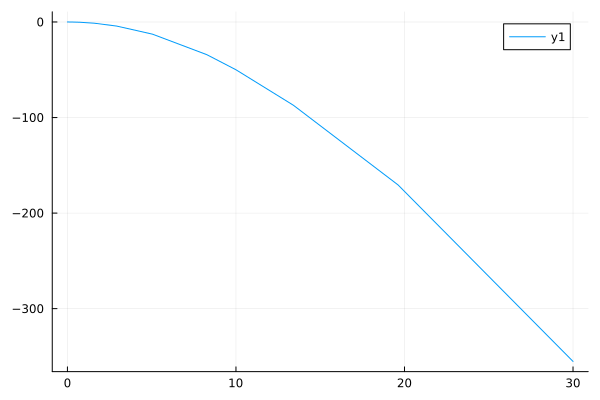

In [504]:
plot(sol.t, vec2mat(sol.u)[:,10])

In [505]:
10.0*substitute(compute_symbolic_derivatives_of_loss(s_loss)[o_t0], unsym_dict(Dict(
    :o_t0 => sol(t0)[3],
    :o_t0pdt => sol(t0+d)[3], 
    :o_t1 => sol(t1)[3],
    :p_s => 0.05
)))

KeyError: KeyError: key o_t0 not found

In [506]:
10.0*substitute(compute_symbolic_derivatives_of_loss(s_loss)[o_t1], unsym_dict(Dict(
    :o_t0 => sol(t0)[3],
    :o_t0pdt => sol(t0+d)[3], 
    :o_t1 => sol(t1)[3],
    :p_s => 0.05
)))

KeyError: KeyError: key o_t1 not found

In [507]:
10.0*substitute(compute_symbolic_derivatives_of_loss(s_loss)[o_t0pdt], unsym_dict(Dict(
    :o_t0 => sol(t0)[3],
    :o_t0pdt => sol(t0+d)[3], 
    :o_t1 => sol(t1)[3],
    :p_s => 0.05
)))

KeyError: KeyError: key o_t0pdt not found

In [508]:
findall((x) -> isequal(x,:k_54), [ i for i in keys(pars_l.p)])

1-element Vector{Int64}:
 57

In [509]:
gradient_tape[2]

80-element Vector{Float64}:
 0.11819099745099933
 0.1460064603587667
 0.1557956986808065
 0.19236468963848402
 0.1846104264435521
 0.07706535214284659
 0.1219844636128601
 0.07766610309946512
 0.12296525732024151
 0.04902738552421303
 ⋮
 0.03937014532806622
 0.07843412829599392
 0.038435240813092186
 0.12006424242060794
 0.04697828162450173
 0.05362654000176415
 0.06316711520276942
 0.053076442470342294
 0.06503153548473198

In [510]:
jacobian_pars(ode_crn, loss_args, loss_derivatives, sol, 3, 10., 20., pars_v, 0.5, 0.1, [[Symbol("x_$(i)") for i in 1:3]..., Symbol("U")]).sensitivity

MethodError: MethodError: no method matching jacobian_pars(::ODESystem, ::Vector{NamedTuple{(:eval, :sym, :args, :weight)}}, ::Dict{Num, Num}, ::ODESolution{Float64, 2, Vector{Vector{Float64}}, Nothing, Nothing, Vector{Float64}, Vector{Vector{Vector{Float64}}}, ODEProblem{Vector{Float64}, Tuple{Float64, Float64}, true, Vector{Float64}, ODEFunction{true, SciMLBase.AutoSpecialize, FunctionWrappersWrappers.FunctionWrappersWrapper{Tuple{FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{Float64}, Vector{Float64}, Vector{Float64}, Float64}}, FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{Float64}, Float64}}, FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{Float64}, Vector{Float64}, ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}}, FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{Float64}, ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}}}, false}, UniformScaling{Bool}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, ModelingToolkit.var"#679#generated_observed#513"{Bool, ODESystem, Dict{Any, Any}, Vector{SymbolicUtils.BasicSymbolic{Real}}}, Nothing, ODESystem, Nothing, Nothing}, Base.Pairs{Symbol, Union{}, Tuple{}, @NamedTuple{}}, SciMLBase.StandardODEProblem}, Tsit5{typeof(OrdinaryDiffEq.trivial_limiter!), typeof(OrdinaryDiffEq.trivial_limiter!), Static.False}, OrdinaryDiffEq.InterpolationData{ODEFunction{true, SciMLBase.AutoSpecialize, FunctionWrappersWrappers.FunctionWrappersWrapper{Tuple{FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{Float64}, Vector{Float64}, Vector{Float64}, Float64}}, FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{Float64}, Float64}}, FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{Float64}, Vector{Float64}, ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}}, FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{Float64}, ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}}}, false}, UniformScaling{Bool}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, ModelingToolkit.var"#679#generated_observed#513"{Bool, ODESystem, Dict{Any, Any}, Vector{SymbolicUtils.BasicSymbolic{Real}}}, Nothing, ODESystem, Nothing, Nothing}, Vector{Vector{Float64}}, Vector{Float64}, Vector{Vector{Vector{Float64}}}, Nothing, OrdinaryDiffEq.Tsit5Cache{Vector{Float64}, Vector{Float64}, Vector{Float64}, typeof(OrdinaryDiffEq.trivial_limiter!), typeof(OrdinaryDiffEq.trivial_limiter!), Static.False}, Nothing}, SciMLBase.DEStats, Nothing}, ::Int64, ::Float64, ::Float64, ::Vector{Float64}, ::Float64, ::Float64, ::Vector{Symbol})

Closest candidates are:
  jacobian_pars(::Any, ::Any, ::Any, ::Any, ::Any, ::Any, ::Any, ::Any, ::Any, ::Any, ::Any, !Matched::Any)
   @ Main ~/git/SynthEvo/SymbolicOps.jl:461


In [511]:
sensitivity(ode_crn, pars_v)[:, 54]

3-element Vector{Num}:
        -(x_1(t)^2) + (-k_14 - k_15 - k_16 - k_27 - k_6 - k_7 - (2//1)*k_30*x_1(t) - k_31*x_2(t) - k_32*x_3(t) - (2//1)*k_36*x_1(t) - (2//1)*k_37*x_1(t) - k_39*x_2(t) - k_40*x_2(t) - k_42*x_3(t) - k_43*x_3(t) - k_51*x_1(t) - k_52*x_1(t) - (2//1)*k_53*x_1(t) - (2//1)*k_54*x_1(t) - (2//1)*k_55*x_1(t) + k_56*x_2(t) - k_58*x_2(t) - k_59*x_2(t) - k_60*x_2(t) + k_61*x_3(t) - k_63*x_3(t) - k_64*x_3(t) - k_65*x_3(t))*ks_1_54(t) + (2k_17 + k_18 + k_19 + k_8 - k_31*x_1(t) - k_39*x_1(t) - k_40*x_1(t) + k_44*x_2(t) + k_46*x_3(t) + k_56*x_1(t) - k_58*x_1(t) - k_59*x_1(t) - k_60*x_1(t) + 2k_66*x_2(t) + k_67*x_2(t) + k_68*x_2(t) + 2k_71*x_3(t) + k_72*x_3(t) + k_73*x_3(t))*ks_2_54(t) + (k_10 + 2k_22 + k_23 + k_24 - k_32*x_1(t) - k_42*x_1(t) - k_43*x_1(t) + k_46*x_2(t) + k_49*x_3(t) + k_61*x_1(t) - k_63*x_1(t) - k_64*x_1(t) - k_65*x_1(t) + 2k_71*x_2(t) + k_72*x_2(t) + k_73*x_2(t) + 2k_76*x_3(t) + k_77*x_3(t) + k_78*x_3(t))*ks_3_54(t)
  (1//2)*(x_1(t)^2) + (-k_17 - k_19 - k_21 - k

In [512]:
jacobian_pars(ode_crn, loss_args, loss_derivatives, sol, 3, 10., 20., pars_v, 0.5, 0.1, [[Symbol("x_$(i)") for i in 1:3]..., Symbol("U")]).sensitivity[54]

MethodError: MethodError: no method matching jacobian_pars(::ODESystem, ::Vector{NamedTuple{(:eval, :sym, :args, :weight)}}, ::Dict{Num, Num}, ::ODESolution{Float64, 2, Vector{Vector{Float64}}, Nothing, Nothing, Vector{Float64}, Vector{Vector{Vector{Float64}}}, ODEProblem{Vector{Float64}, Tuple{Float64, Float64}, true, Vector{Float64}, ODEFunction{true, SciMLBase.AutoSpecialize, FunctionWrappersWrappers.FunctionWrappersWrapper{Tuple{FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{Float64}, Vector{Float64}, Vector{Float64}, Float64}}, FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{Float64}, Float64}}, FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{Float64}, Vector{Float64}, ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}}, FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{Float64}, ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}}}, false}, UniformScaling{Bool}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, ModelingToolkit.var"#679#generated_observed#513"{Bool, ODESystem, Dict{Any, Any}, Vector{SymbolicUtils.BasicSymbolic{Real}}}, Nothing, ODESystem, Nothing, Nothing}, Base.Pairs{Symbol, Union{}, Tuple{}, @NamedTuple{}}, SciMLBase.StandardODEProblem}, Tsit5{typeof(OrdinaryDiffEq.trivial_limiter!), typeof(OrdinaryDiffEq.trivial_limiter!), Static.False}, OrdinaryDiffEq.InterpolationData{ODEFunction{true, SciMLBase.AutoSpecialize, FunctionWrappersWrappers.FunctionWrappersWrapper{Tuple{FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{Float64}, Vector{Float64}, Vector{Float64}, Float64}}, FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{Float64}, Float64}}, FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{Float64}, Vector{Float64}, ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}}, FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{Float64}, ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}}}, false}, UniformScaling{Bool}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, ModelingToolkit.var"#679#generated_observed#513"{Bool, ODESystem, Dict{Any, Any}, Vector{SymbolicUtils.BasicSymbolic{Real}}}, Nothing, ODESystem, Nothing, Nothing}, Vector{Vector{Float64}}, Vector{Float64}, Vector{Vector{Vector{Float64}}}, Nothing, OrdinaryDiffEq.Tsit5Cache{Vector{Float64}, Vector{Float64}, Vector{Float64}, typeof(OrdinaryDiffEq.trivial_limiter!), typeof(OrdinaryDiffEq.trivial_limiter!), Static.False}, Nothing}, SciMLBase.DEStats, Nothing}, ::Int64, ::Float64, ::Float64, ::Vector{Float64}, ::Float64, ::Float64, ::Vector{Symbol})

Closest candidates are:
  jacobian_pars(::Any, ::Any, ::Any, ::Any, ::Any, ::Any, ::Any, ::Any, ::Any, ::Any, ::Any, !Matched::Any)
   @ Main ~/git/SynthEvo/SymbolicOps.jl:461
